# Plot selected profiles

Criteria is entered to select certain profiles, then it generates

(1) raw O2 profiles

(2) adjusted O2 profiles

(3) co-located WOA climatology

(4) differences from the climatology

(5) float trajectory

(6) histogram of RMSE

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import pandas as pd
import os
import re
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [21]:
# read in the summary statistics
df=pd.read_csv('float_summary_statsitics.csv')
rmse=df['RMSE_ADJ(500-2000m)'][:]
rmse0=df['RMSE_ADJ(0-2000m)'][:]

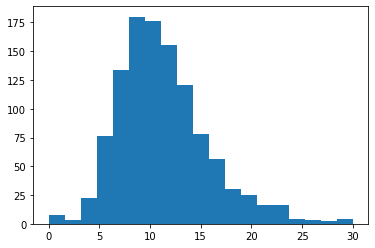

based on 500-2000m RMSE data
there are  1528  DOXY profiles
there are  481  acceptable profiles (rmse < 10uM)


In [22]:
# find very good ones
ind=np.where(rmse<=10)
#
bins=np.linspace(0,30,20)
hdat=plt.hist(rmse,bins)
plt.show()
fn=df['File'].to_numpy()
print('based on 500-2000m RMSE data')
print('there are ',np.size(rmse),' DOXY profiles')
print('there are ',np.size(ind),' acceptable profiles (rmse < 10uM)')
plt.show()

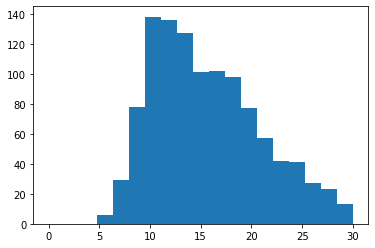

based on 0-2000m and 500-2000m RMSE data
there are  1528  DOXY profiles
there are  273  acceptable profiles (rmse < 15uM for 0-2000m, and 10 for 500-2000m)


In [23]:
# find very good ones
ind=np.where((rmse0<=15)&(rmse<10))
#
bins=np.linspace(0,30,20)
hdat=plt.hist(rmse0,bins)
plt.show()
fn=df['File'].to_numpy()
print('based on 0-2000m and 500-2000m RMSE data')
print('there are ',np.size(rmse),' DOXY profiles')
print('there are ',np.size(ind),' acceptable profiles (rmse < 15uM for 0-2000m, and 10 for 500-2000m)')
plt.show()

In [24]:
def gen_plots(n): 
    # generate plots
    fig=plt.figure(figsize=(8, 8))
    ####
    ds=xr.open_dataset(fn[n])
    vn=np.min(ds.O2_WOA)
    vp=np.max(ds.O2_WOA)
    dO2_FLT=ds.O2_FLT-ds.O2_WOA
    dO2_FLT_ADJUSTED=ds.O2_FLT_ADJUSTED-ds.O2_WOA
    fltid=re.findall('\d+',fn[n])
    ##
    ax11 = fig.add_axes([0.1, 0.75,0.25,0.17])
    ds.O2_FLT_ADJUSTED.T.plot(ylim=(2000,0),vmin=vn,vmax=vp)
    ax11.set_title('WMO'+fltid[0])
    ##
    ax21 = fig.add_axes([0.1, 0.5,0.25,0.17])
    ds.O2_WOA.T.plot(ylim=(2000,0),vmin=vn,vmax=vp)
    plt.title('WOA09')
    ##
    ax31 = fig.add_axes([0.1, 0.25,0.23,0.17])
    flt0 = ds.O2_FLT_ADJUSTED
    woa0 = ds.O2_WOA
    woa0[np.where(flt0==np.nan)]=np.nan
    fltmn = flt0.mean(dim='profile')
    woamn = woa0.mean(dim='profile')
    plt.plot(fltmn,ds.depth,'k-',label='FLT')
    plt.plot(woamn,ds.depth,'m-',label='WOA')
    plt.legend()
    plt.xlabel('O2, micro-mol/kg')
    plt.ylabel('depth')
    plt.title('avg. profile')
    plt.ylim(2000,0)
    ##
    ax12 = fig.add_axes([0.42, 0.75,0.25,0.17])
    dO2_FLT_ADJUSTED.T.plot(ylim=(2000,0),vmin=-30,vmax=30,yticks=[],cmap='RdBu_r')
    plt.ylabel('')
    plt.title('O2: (FLT_ADJ) - (WOA)')
    ##
    ax22 = fig.add_axes([0.48, 0.5,0.18,0.17])
    plt.plot(ds.LONGITUDE,ds.LATITUDE,'b.-')
    plt.xlabel('longitude')
    plt.ylabel('latitude')
    plt.title('trajectory')
    ##
    ax32 = fig.add_axes([0.42, 0.25,0.23,0.17])
    do2mn = dO2_FLT_ADJUSTED.mean(dim='profile')
    do2md = dO2_FLT_ADJUSTED.median(dim='profile')
    plt.plot(do2mn,ds.depth,'r-',label='mean')
    plt.plot(do2md,ds.depth,'b-',label='median')
    plt.legend()
    plt.xlabel('O2 (FLT_ADJ) - (WOD),micro-mol/kg')
    plt.ylabel('depth')
    plt.title('avg. profile diff')
    plt.ylim(2000,0)
  
    ##
    fign='fig_'+fltid[0]+'_WOA'
    plt.savefig('./fig/'+fign+'.pdf',bbox_inches="tight",dpi=300)
    #plt.savefig('./fig/'+fn+'.png',bbox_inches="tight",dpi=300)
    plt.show()
    

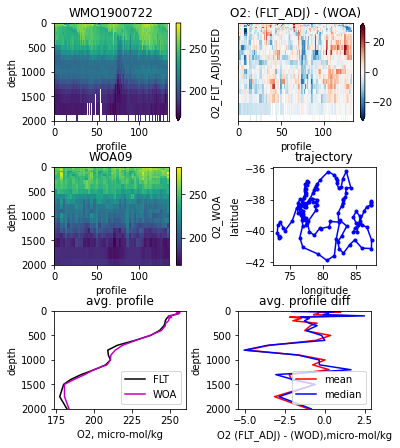

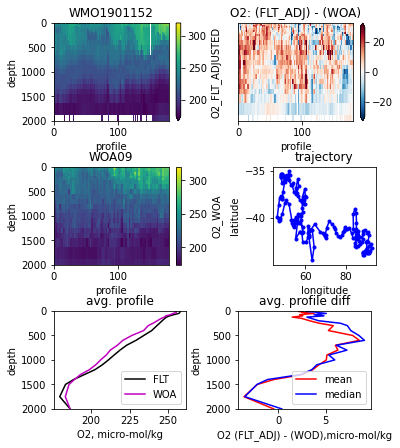

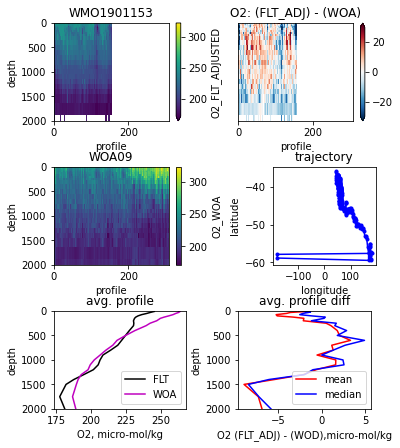

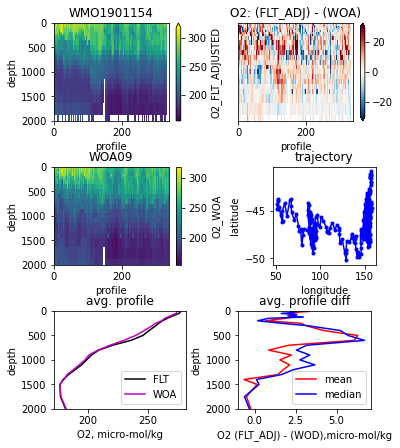

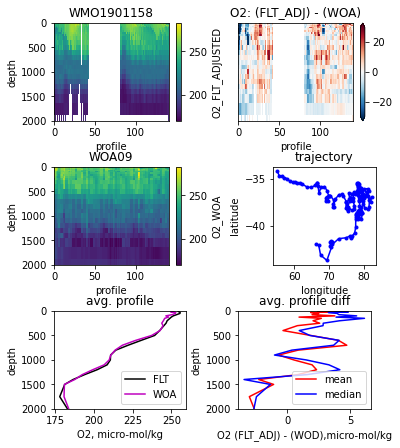

...

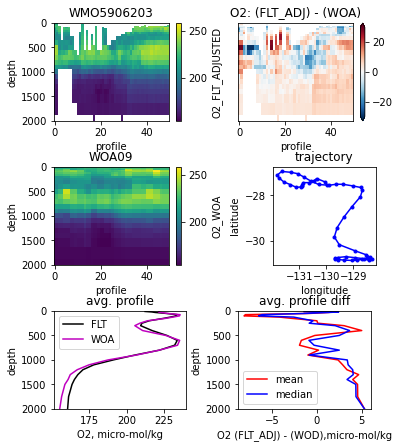

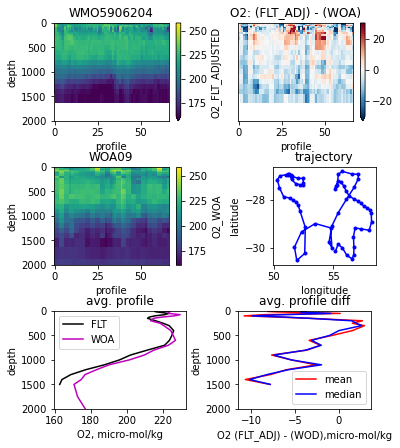

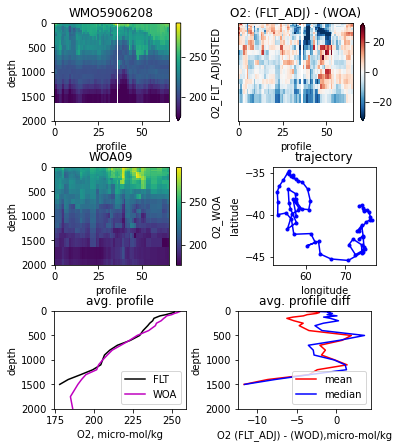

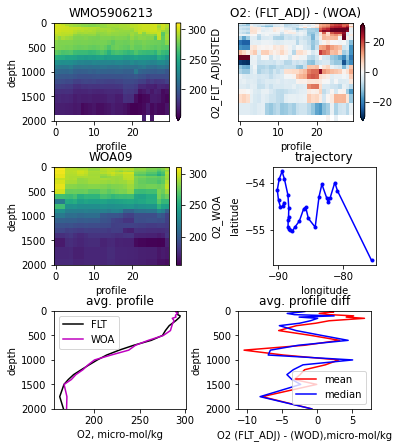

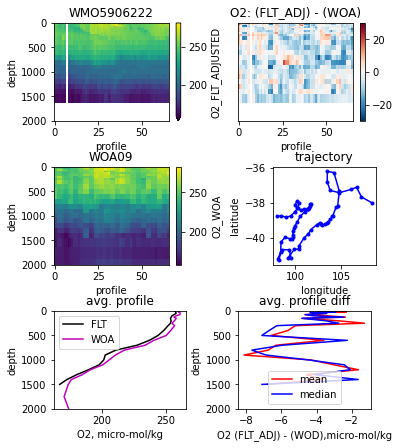

AttributeError: 'Line2D' object has no property 'vmin'

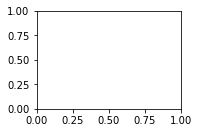

In [25]:
for n in range(0,np.size(ind)):
    gen_plots(ind[0][n])